###### Problem Statement

- classify the Size_Categorie using SVM
- Size_Categorie - the burned area of the forest ( Small , Large)

In [1]:
#Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,precision_score,recall_score,f1_score

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

- Dataset:- forestfires.csv

In [2]:
df = pd.read_csv('forestfires.csv')
df

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small


###### EDA

In [3]:
df.shape

(517, 31)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 31 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   month          517 non-null    object 
 1   day            517 non-null    object 
 2   FFMC           517 non-null    float64
 3   DMC            517 non-null    float64
 4   DC             517 non-null    float64
 5   ISI            517 non-null    float64
 6   temp           517 non-null    float64
 7   RH             517 non-null    int64  
 8   wind           517 non-null    float64
 9   rain           517 non-null    float64
 10  area           517 non-null    float64
 11  dayfri         517 non-null    int64  
 12  daymon         517 non-null    int64  
 13  daysat         517 non-null    int64  
 14  daysun         517 non-null    int64  
 15  daythu         517 non-null    int64  
 16  daytue         517 non-null    int64  
 17  daywed         517 non-null    int64  
 18  monthapr  

In [5]:
df.describe()

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,...,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292,0.164410,...,0.017408,0.038685,0.003868,0.061896,0.032882,0.104449,0.003868,0.001934,0.029014,0.332689
std,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818,0.371006,...,0.130913,0.193029,0.062137,0.241199,0.178500,0.306138,0.062137,0.043980,0.168007,0.471632
min,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [6]:
df.describe(include='O')

,month,day,size_category
count,517,517,517
unique,12,7,2
top,aug,sun,small
freq,184,95,378


In [7]:
#Checking null entries.
df.isna().sum()

month            0
day              0
FFMC             0
DMC              0
DC               0
ISI              0
temp             0
RH               0
wind             0
rain             0
area             0
dayfri           0
daymon           0
daysat           0
daysun           0
daythu           0
daytue           0
daywed           0
monthapr         0
monthaug         0
monthdec         0
monthfeb         0
monthjan         0
monthjul         0
monthjun         0
monthmar         0
monthmay         0
monthnov         0
monthoct         0
monthsep         0
size_category    0
dtype: int64

In [8]:
#Duplicate entries
df[df.duplicated(keep=False)]

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
52,aug,wed,92.1,111.2,654.1,9.6,20.4,42,4.9,0.0,...,0,0,0,0,0,0,0,0,0,small
53,aug,wed,92.1,111.2,654.1,9.6,20.4,42,4.9,0.0,...,0,0,0,0,0,0,0,0,0,small
99,aug,sun,91.4,142.4,601.4,10.6,19.8,39,5.4,0.0,...,0,0,0,0,0,0,0,0,0,small
100,aug,sun,91.4,142.4,601.4,10.6,19.8,39,5.4,0.0,...,0,0,0,0,0,0,0,0,0,small
214,mar,sat,91.7,35.8,80.8,7.8,17.0,27,4.9,0.0,...,0,0,0,0,1,0,0,0,0,large
215,mar,sat,91.7,35.8,80.8,7.8,17.0,27,4.9,0.0,...,0,0,0,0,1,0,0,0,0,large
302,jun,fri,91.1,94.1,232.1,7.1,19.2,38,4.5,0.0,...,0,0,0,1,0,0,0,0,0,small
303,jun,fri,91.1,94.1,232.1,7.1,19.2,38,4.5,0.0,...,0,0,0,1,0,0,0,0,0,small
425,aug,thu,91.6,248.4,753.8,6.3,20.4,56,2.2,0.0,...,0,0,0,0,0,0,0,0,0,small
426,aug,thu,91.6,248.4,753.8,6.3,20.4,56,2.2,0.0,...,0,0,0,0,0,0,0,0,0,small


In [9]:
#Drop duplicates.
df.drop_duplicates(keep='first', inplace=True)

In [10]:
#Checking min aand max values.
df[['FFMC','DMC','DC','ISI','temp','RH','wind','rain','area']].agg(['min','max'])

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
min,18.7,1.1,7.9,0.0,2.2,15,0.4,0.0,0.00
max,96.2,291.3,860.6,56.1,33.3,100,9.4,6.4,1090.84


- Visualisation

In [11]:
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250

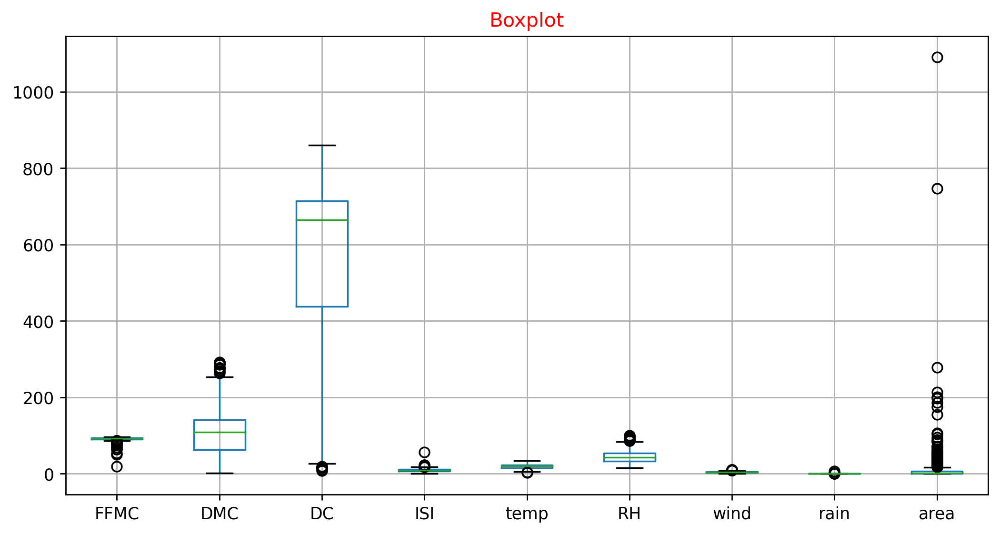

In [12]:
df[['FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain', 'area']].boxplot()
plt.title('Boxplot', c='r');

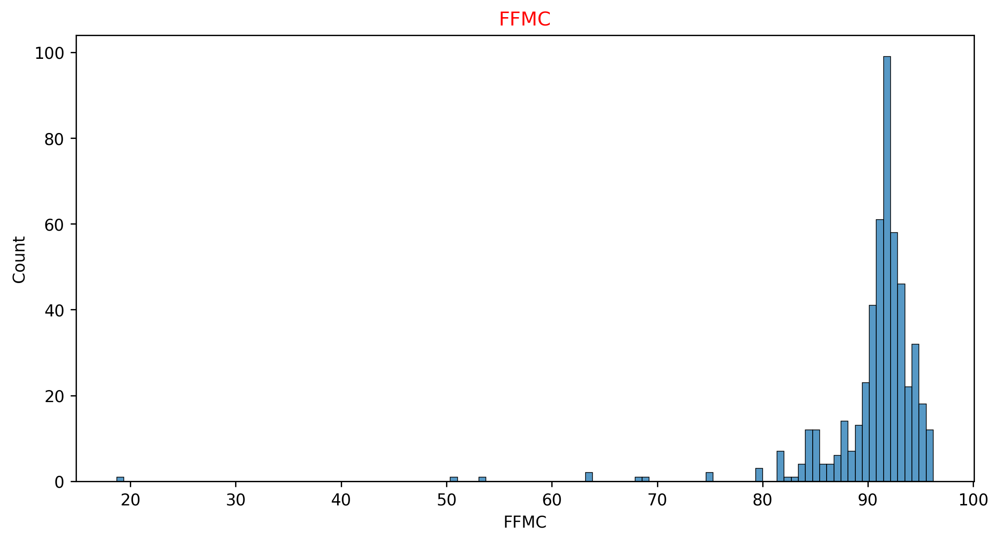

In [13]:
sns.histplot(df['FFMC'])
plt.title('FFMC', c='r');

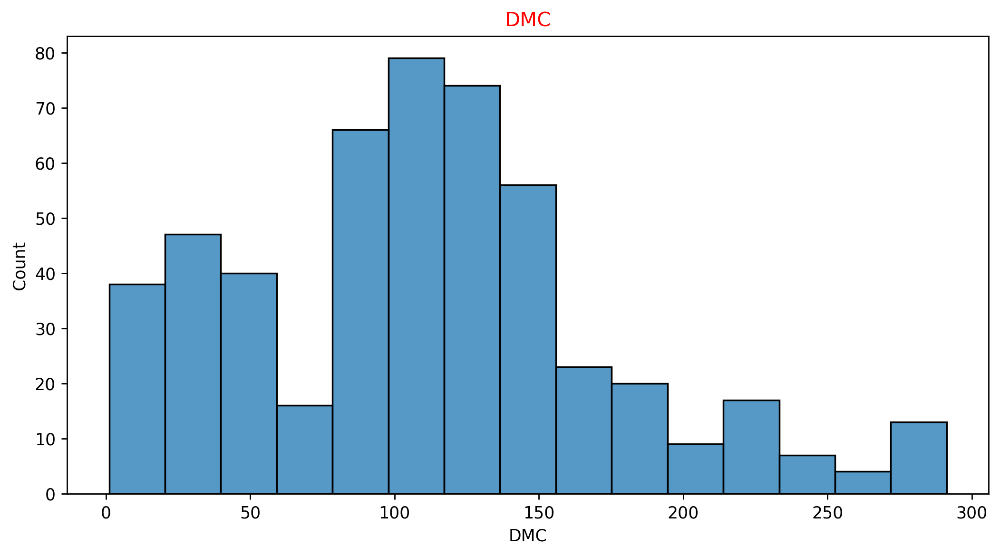

In [14]:
sns.histplot(df['DMC'])
plt.title('DMC', c='r');

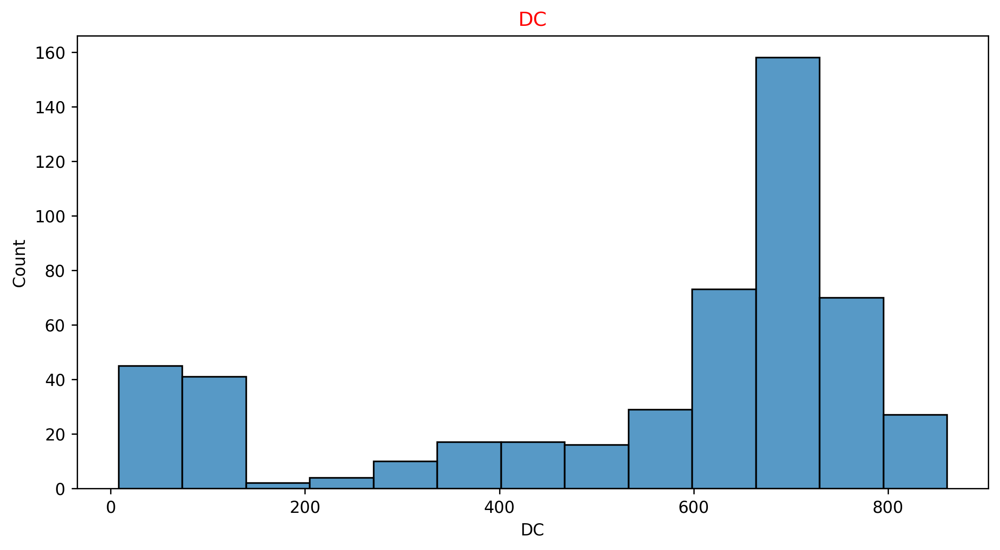

In [15]:
sns.histplot(df['DC'])
plt.title('DC', c='r');

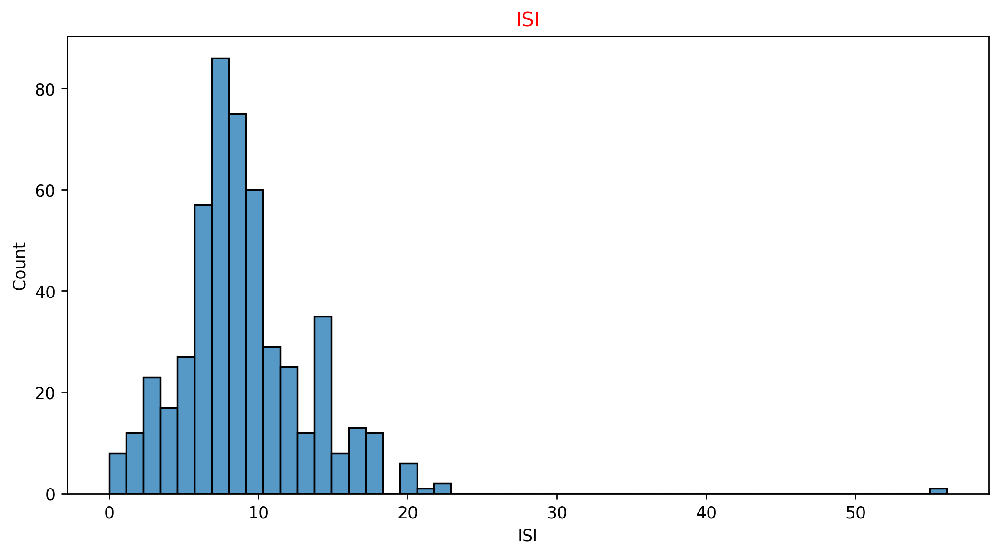

In [16]:
sns.histplot(df['ISI'])
plt.title('ISI', c='r');

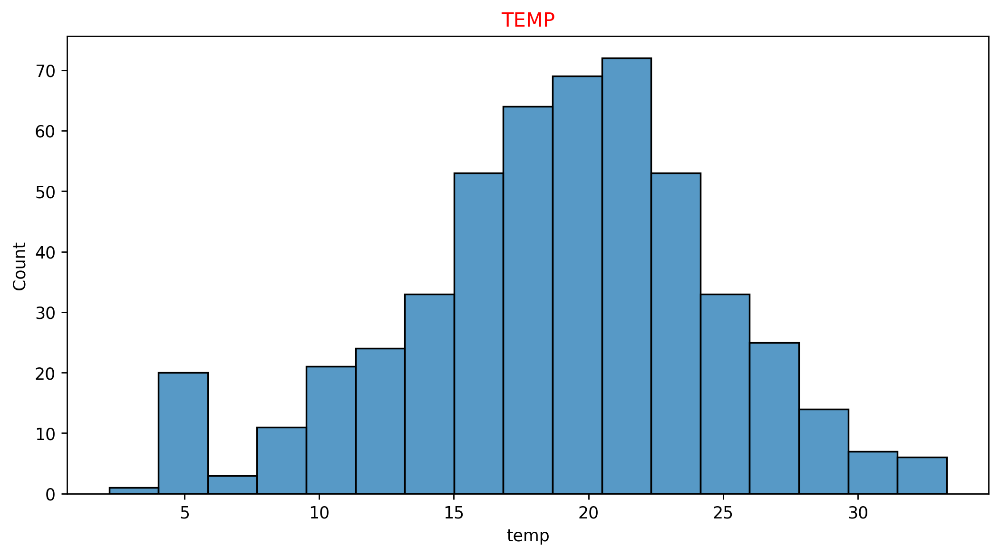

In [17]:
sns.histplot(df['temp'])
plt.title('TEMP', c='r');

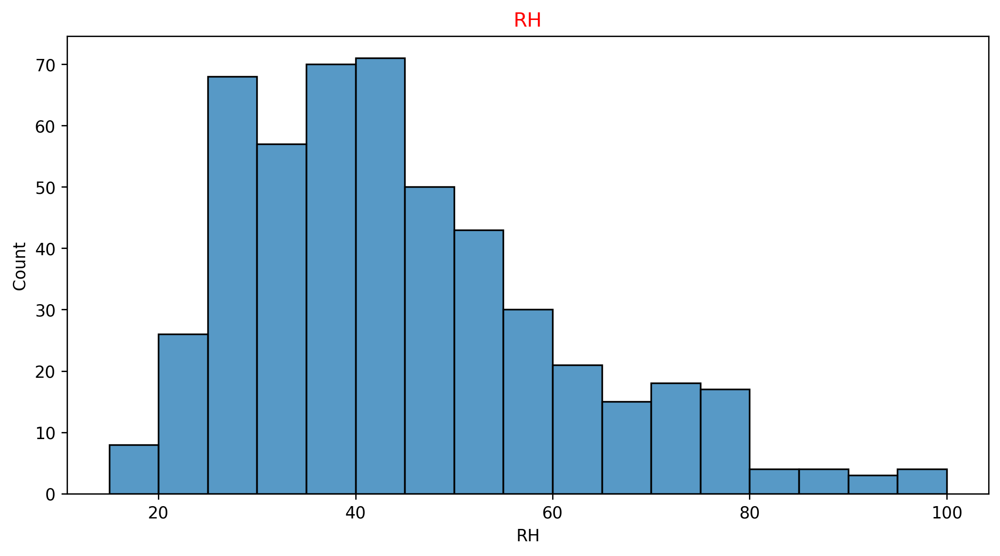

In [18]:
sns.histplot(df['RH'])
plt.title('RH', c='r');

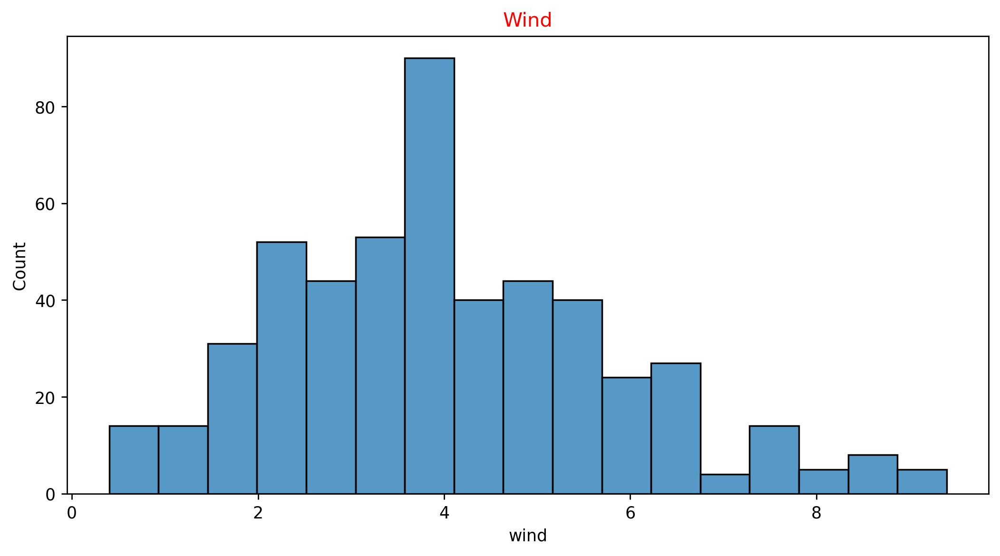

In [19]:
sns.histplot(df['wind'])
plt.title('Wind', c='r');

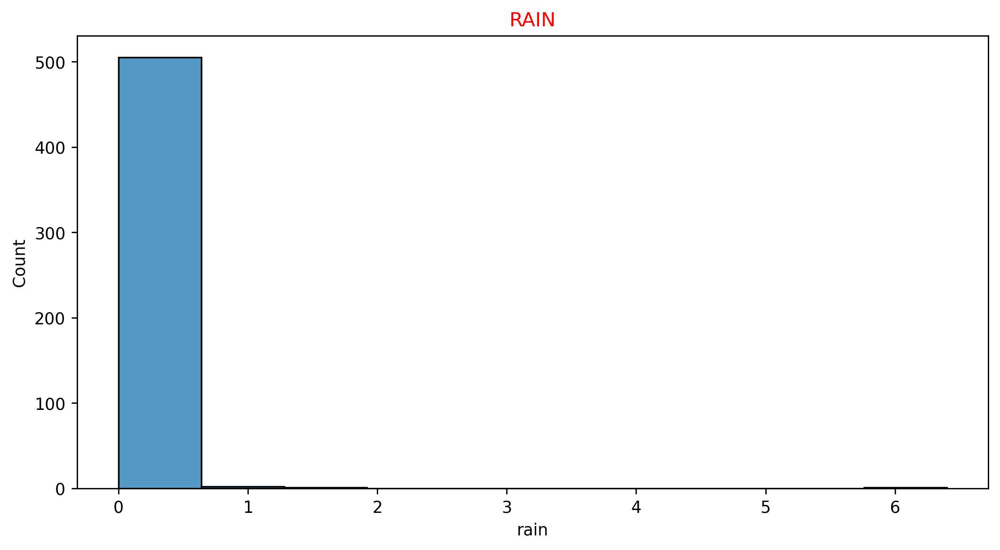

In [20]:
sns.histplot(df['rain'])
plt.title('RAIN', c='r');

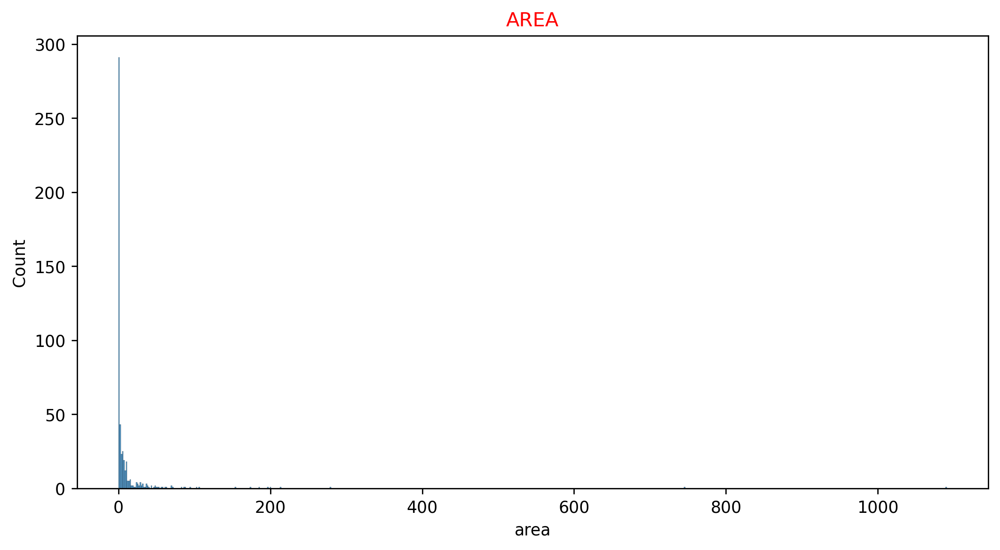

In [21]:
sns.histplot(df['area'])
plt.title('AREA', c='r');

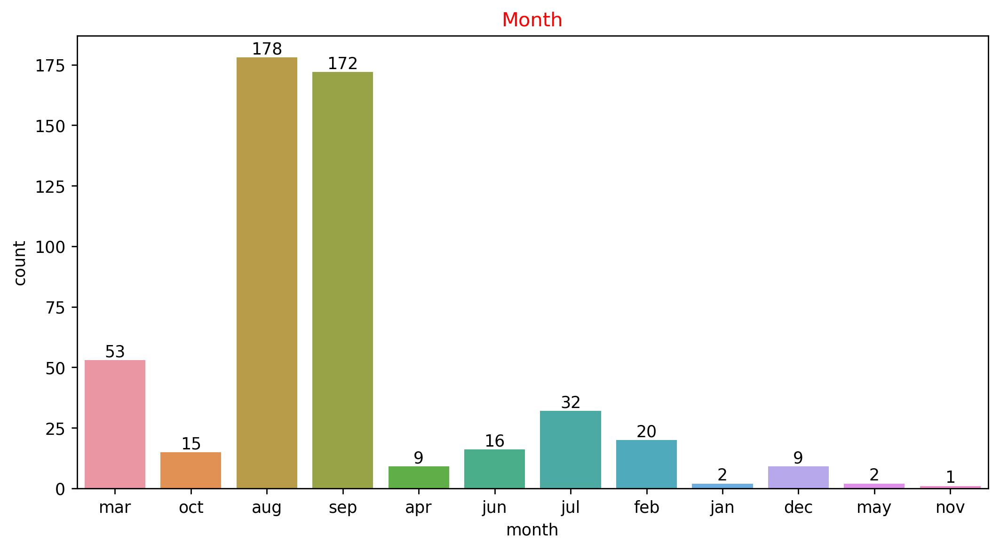

In [22]:
ax = sns.countplot('month', data=df)
ax.bar_label(ax.containers[0]);
plt.title('Month', c='r');

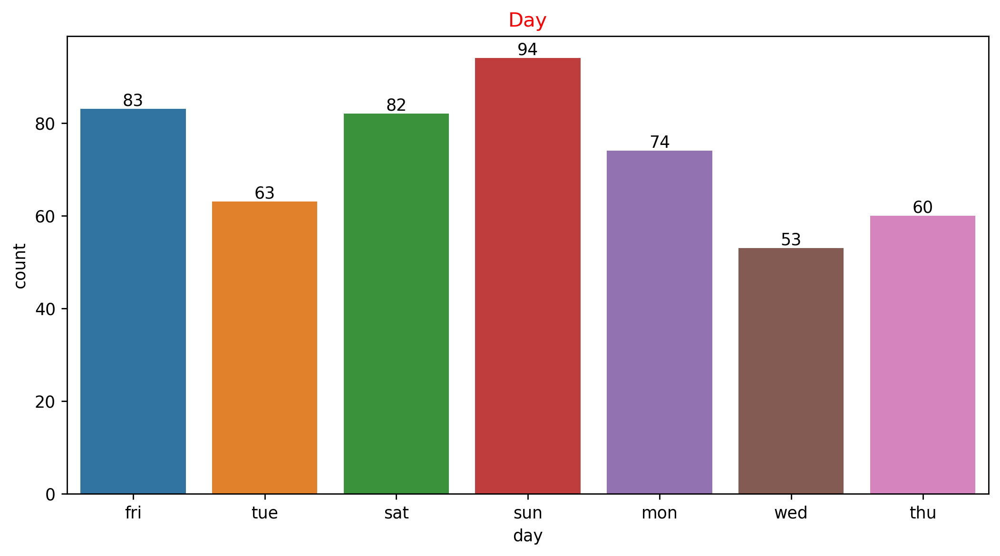

In [23]:
ax = sns.countplot('day', data=df)
ax.bar_label(ax.containers[0]);
plt.title('Day', c='r');

In [24]:
#Drop month and day variable.
df.drop(columns=['month','day'], axis=1, inplace=True)
df

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00,1,...,0,0,0,0,1,0,0,0,0,small
1,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00,0,...,0,0,0,0,0,0,0,1,0,small
2,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00,0,...,0,0,0,0,0,0,0,1,0,small
3,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00,1,...,0,0,0,0,1,0,0,0,0,small
4,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00,0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,0,...,0,0,0,0,0,0,0,0,0,large
513,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,0,...,0,0,0,0,0,0,0,0,0,large
514,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,0,...,0,0,0,0,0,0,0,0,0,large
515,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,small


- Encoding

In [25]:
#Label encoding for target variable.

le = LabelEncoder()

df['size_category'] = le.fit_transform(df['size_category'])

df

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00,1,...,0,0,0,0,1,0,0,0,0,1
1,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00,0,...,0,0,0,0,0,0,0,1,0,1
2,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00,0,...,0,0,0,0,0,0,0,1,0,1
3,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00,1,...,0,0,0,0,1,0,0,0,0,1
4,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00,0,...,0,0,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,0,...,0,0,0,0,0,0,0,0,0,0
513,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,0,...,0,0,0,0,0,0,0,0,0,0
514,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,0,...,0,0,0,0,0,0,0,0,0,0
515,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,0,...,0,0,0,0,0,0,0,0,0,1


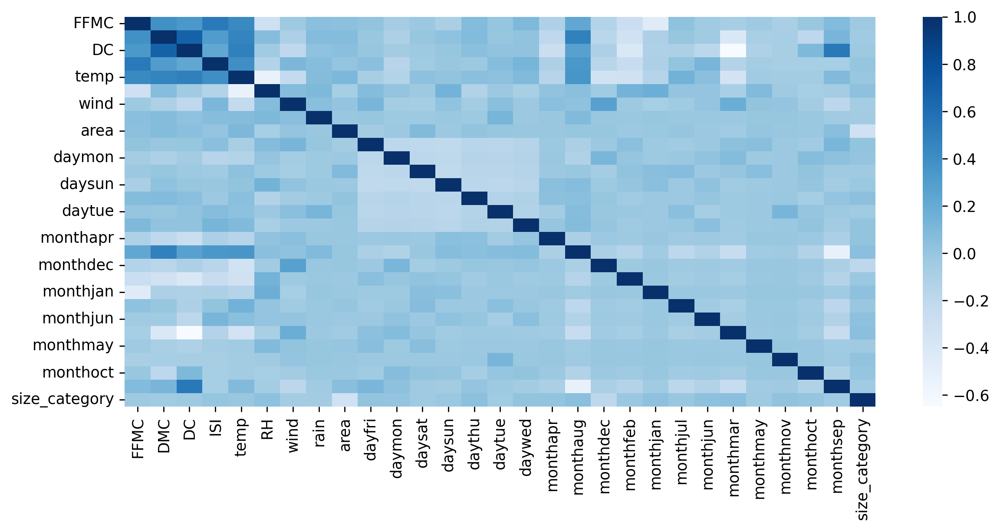

In [26]:
sns.heatmap(df.corr(), cmap='Blues')
plt.tight_layout()

In [27]:
sns.pairplot(df, hue='size_category')

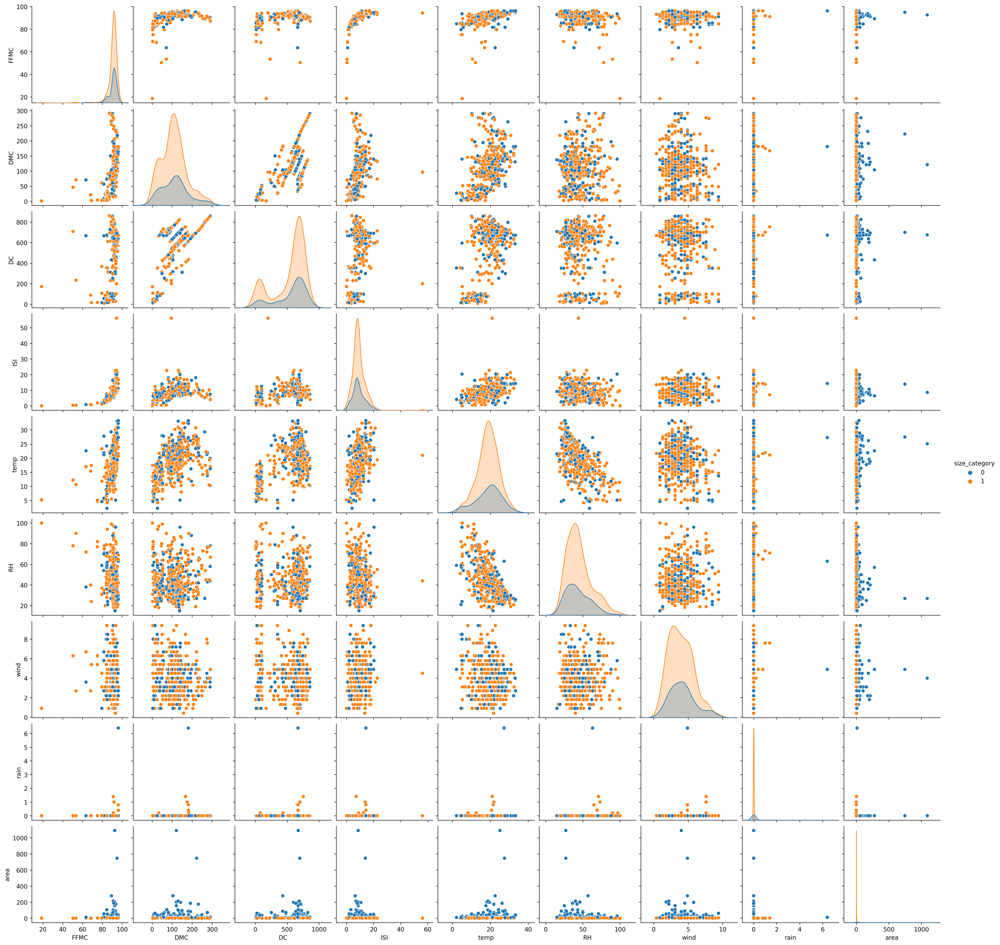

In [28]:
sns.pairplot(df[['FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain', 'area', 'size_category']], hue='size_category', data=df)

In [29]:
x = df.iloc[:,0:-1]
y = df['size_category']

In [30]:
#Standardization

sc = StandardScaler()

sc.fit_transform(x)

array([[-7.96039810e-01, -1.31838569e+00, -1.82893094e+00, ...,
        -4.43678255e-02, -1.74253759e-01, -7.14412875e-01],
       [-3.25665522e-03, -1.17405250e+00,  4.89256926e-01, ...,
        -4.43678255e-02,  5.73875712e+00, -7.14412875e-01],
       [-3.25665522e-03, -1.04383887e+00,  5.61044929e-01, ...,
        -4.43678255e-02,  5.73875712e+00, -7.14412875e-01],
       ...,
       [-1.62485856e+00, -8.39889805e-01,  4.75141308e-01, ...,
        -4.43678255e-02, -1.74253759e-01, -7.14412875e-01],
       [ 6.81419706e-01,  5.61083388e-01,  2.69859884e-01, ...,
        -4.43678255e-02, -1.74253759e-01, -7.14412875e-01],
       [-2.00323234e+00, -1.68235633e+00, -1.77892132e+00, ...,
         2.25388553e+01, -1.74253759e-01, -7.14412875e-01]])

###### Model Building

In [31]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2,random_state=1)

- Kernel = rbf

In [32]:
svc = SVC(kernel='rbf')

svc.fit(xtrain,ytrain)
ypred = svc.predict(xtest)

print(classification_report(ytest,ypred))

print('Training Accuracy = ', svc.score(xtrain,ytrain))
print('Testing Accuracy = ', svc.score(xtest,ytest))

              precision    recall  f1-score   support

           0       1.00      0.08      0.15        25
           1       0.77      1.00      0.87        77

    accuracy                           0.77       102
   macro avg       0.89      0.54      0.51       102
weighted avg       0.83      0.77      0.69       102

Training Accuracy =  0.7518427518427518
Testing Accuracy =  0.7745098039215687


In [33]:
cm = confusion_matrix(ytest,ypred)
cm

array([[ 2, 23],
       [ 0, 77]], dtype=int64)

- Kernel = poly

In [34]:
svc1 = SVC(kernel='poly')

svc1.fit(xtrain,ytrain)
ypred1 = svc1.predict(xtest)

print(classification_report(ytest,ypred1))

print('Training Accuracy = ', svc1.score(xtrain,ytrain))
print('Testing Accuracy = ', svc1.score(xtest,ytest))

              precision    recall  f1-score   support

           0       1.00      0.20      0.33        25
           1       0.79      1.00      0.89        77

    accuracy                           0.80       102
   macro avg       0.90      0.60      0.61       102
weighted avg       0.84      0.80      0.75       102

Training Accuracy =  0.7641277641277642
Testing Accuracy =  0.803921568627451


In [35]:
confusion_matrix(ytest,ypred1)

array([[ 5, 20],
       [ 0, 77]], dtype=int64)

- Kernel = linear

In [36]:
svc2 = SVC(kernel='linear')

svc2.fit(xtrain,ytrain)
ypred2 = svc2.predict(xtest)

print(classification_report(ytest,ypred2))

print('Training Accuracy = ', svc2.score(xtrain,ytrain))
print('Testing Accuracy = ', svc2.score(xtest,ytest))

              precision    recall  f1-score   support

           0       1.00      0.92      0.96        25
           1       0.97      1.00      0.99        77

    accuracy                           0.98       102
   macro avg       0.99      0.96      0.97       102
weighted avg       0.98      0.98      0.98       102

Training Accuracy =  1.0
Testing Accuracy =  0.9803921568627451


In [37]:
confusion_matrix(ytest,ypred2)

array([[23,  2],
       [ 0, 77]], dtype=int64)

###### Hyperparameter tuning

- Using = GridSearchCV

In [38]:
from sklearn.model_selection import GridSearchCV

In [39]:
svc3 = SVC()

params = {
    'C' : [0.0001,0.001,0.01,0.1,1,10,100],
    'kernel' : ['linear','rbf','poly'],
    'gamma' : [0.1,0.001,1,10]
}

In [40]:
grid = GridSearchCV(estimator=SVC(), param_grid=params)
grid.fit(xtrain,ytrain)

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                         'gamma': [0.1, 0.001, 1, 10],
                         'kernel': ['linear', 'rbf', 'poly']})

In [41]:
grid.best_params_

{'C': 0.01, 'gamma': 0.1, 'kernel': 'linear'}

- Model building using best parameters obtained from GridSearchCV.

In [42]:
# Model building using best parameters obtained from GridSearchCV.

svc4 = SVC(C=0.01, kernel='linear', gamma=0.1)
svc4.fit(xtrain,ytrain)

ypred4 = svc4.predict(xtest)

print(classification_report(ytest,ypred4))

print('Training Accuracy = ', svc4.score(xtrain,ytrain))
print('Testing Accuracy = ', svc4.score(xtest,ytest))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98        25
           1       0.99      1.00      0.99        77

    accuracy                           0.99       102
   macro avg       0.99      0.98      0.99       102
weighted avg       0.99      0.99      0.99       102

Training Accuracy =  0.9877149877149877
Testing Accuracy =  0.9901960784313726


- Confusion Matrix

In [43]:
confusion_matrix(ytest,ypred4)

array([[24,  1],
       [ 0, 77]], dtype=int64)

In [44]:
Accuracy = accuracy_score(ytest,ypred4)
print('Accuracy = ', Accuracy)
Precision = precision_score(ytest,ypred4)
print('Precision = ', Precision)
Recall = recall_score(ytest,ypred4)
print('Recall = ', Recall)
F1_Score = f1_score(ytest,ypred4)
print('F1_Score = ', F1_Score)

Accuracy =  0.9901960784313726
Precision =  0.9871794871794872
Recall =  1.0
F1_Score =  0.9935483870967742


- Using = RandomizedSearchCV

In [45]:
from sklearn.model_selection import RandomizedSearchCV

In [46]:
svc5 = SVC()

params = {
    'C' : [0.0001,0.001,0.01,0.1,1,10,100],
    'kernel' : ['linear','rbf','poly'],
    'gamma' : [0.1,0.001,1,10]
}

In [47]:
RSCV = RandomizedSearchCV(estimator=SVC(), param_distributions=params, cv=10, verbose=300)

RSCV.fit(xtrain,ytrain)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CV 1/10; 1/10] START C=1, gamma=0.1, kernel=rbf................................
[CV 1/10; 1/10] END .C=1, gamma=0.1, kernel=rbf;, score=0.756 total time=   0.0s
[CV 2/10; 1/10] START C=1, gamma=0.1, kernel=rbf................................
[CV 2/10; 1/10] END .C=1, gamma=0.1, kernel=rbf;, score=0.732 total time=   0.0s
[CV 3/10; 1/10] START C=1, gamma=0.1, kernel=rbf................................
[CV 3/10; 1/10] END .C=1, gamma=0.1, kernel=rbf;, score=0.732 total time=   0.0s
[CV 4/10; 1/10] START C=1, gamma=0.1, kernel=rbf................................
[CV 4/10; 1/10] END .C=1, gamma=0.1, kernel=rbf;, score=0.756 total time=   0.0s
[CV 5/10; 1/10] START C=1, gamma=0.1, kernel=rbf................................
[CV 5/10; 1/10] END .C=1, gamma=0.1, kernel=rbf;, score=0.707 total time=   0.0s
[CV 6/10; 1/10] START C=1, gamma=0.1, kernel=rbf................................
[CV 6/10; 1/10] END .C=1, gamma=0.1, kernel=rb

[CV 4/10; 6/10] END C=100, gamma=0.001, kernel=rbf;, score=0.878 total time=   0.0s
[CV 5/10; 6/10] START C=100, gamma=0.001, kernel=rbf............................
[CV 5/10; 6/10] END C=100, gamma=0.001, kernel=rbf;, score=0.805 total time=   0.0s
[CV 6/10; 6/10] START C=100, gamma=0.001, kernel=rbf............................
[CV 6/10; 6/10] END C=100, gamma=0.001, kernel=rbf;, score=0.854 total time=   0.0s
[CV 7/10; 6/10] START C=100, gamma=0.001, kernel=rbf............................
[CV 7/10; 6/10] END C=100, gamma=0.001, kernel=rbf;, score=0.902 total time=   0.0s
[CV 8/10; 6/10] START C=100, gamma=0.001, kernel=rbf............................
[CV 8/10; 6/10] END C=100, gamma=0.001, kernel=rbf;, score=0.800 total time=   0.0s
[CV 9/10; 6/10] START C=100, gamma=0.001, kernel=rbf............................
[CV 9/10; 6/10] END C=100, gamma=0.001, kernel=rbf;, score=0.925 total time=   0.0s
[CV 10/10; 6/10] START C=100, gamma=0.001, kernel=rbf...........................
[CV 10/10;

RandomizedSearchCV(cv=10, estimator=SVC(),
                   param_distributions={'C': [0.0001, 0.001, 0.01, 0.1, 1, 10,
                                              100],
                                        'gamma': [0.1, 0.001, 1, 10],
                                        'kernel': ['linear', 'rbf', 'poly']},
                   verbose=300)

In [48]:
RSCV.best_params_

{'kernel': 'poly', 'gamma': 10, 'C': 0.1}

- Model building using best parameters obtained from RandomizedSearchCV.

In [53]:
svc6 = SVC(C=0.1, kernel='poly', gamma=10)
svc6.fit(xtrain,ytrain)

ypred6 = svc6.predict(xtest)

print(classification_report(ytest,ypred6))

print('Training Accuracy = ', svc6.score(xtrain,ytrain))
print('Testing Accuracy = ', svc6.score(xtest,ytest))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98        25
           1       1.00      0.99      0.99        77

    accuracy                           0.99       102
   macro avg       0.98      0.99      0.99       102
weighted avg       0.99      0.99      0.99       102

Training Accuracy =  1.0
Testing Accuracy =  0.9901960784313726


- Confusion matrix

In [54]:
confusion_matrix(ytest,ypred6)

array([[25,  0],
       [ 1, 76]], dtype=int64)

In [55]:
Accuracy = accuracy_score(ytest,ypred6)
print('Accuracy = ', Accuracy)
Precision = precision_score(ytest,ypred6)
print('Precision = ', Precision)
Recall = recall_score(ytest,ypred6)
print('Recall = ', Recall)
F1_Score = f1_score(ytest,ypred6)
print('F1_Score = ', F1_Score)

Accuracy =  0.9901960784313726
Precision =  1.0
Recall =  0.987012987012987
F1_Score =  0.9934640522875817


## =======================================================================